## TIME SERIES FORECASTING USING BENCHMARKS 

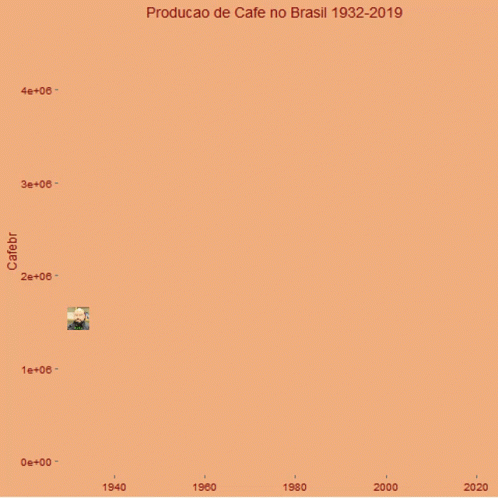

## Project Overview 
- In this Project i shall explore the basics of time series using two datasets
  * AirlinePassenger data
  * Stock Price Data

## Importing Necessary Libraries

In [1]:
import numpy as np 
import seaborn as sns 
import matplotlib.pyplot as plt  
import pandas as pd 
import yfinance as yf 
import warnings
warnings.filterwarnings("ignore")
from rich.console import Console

console = Console()



## Importing the datasets 

In [2]:
## the Airline Passenger data  
airlinepass_data =  pd.read_csv(r"D:\Tong123\DS\airline_passengers.csv",index_col="Month")
## display the first five rows of the data   
airlinepass_data.head()

,Passengers
Month,
1949-01,112
1949-02,118
1949-03,132
1949-04,129
1949-05,121


In [3]:
## lading the stock Price data  
Apple_stock_data = yf.download('AAPL', start='2021-12-22',end='2024-05-01')
## displaying the five rows  
Apple_stock_data.head()

[*********************100%***********************]  1 of 1 completed


,Open,High,Low,Close,Adj Close,Volume
Date,,,,,,
2021-12-22,173.039993,175.860001,172.149994,175.639999,172.809280,92135300
2021-12-23,175.850006,176.850006,175.270004,176.279999,173.438950,68356600
2021-12-27,177.089996,180.419998,177.070007,180.330002,177.423676,74919600
2021-12-28,180.160004,181.330002,178.529999,179.289993,176.400406,79144300
2021-12-29,179.330002,180.630005,178.139999,179.380005,176.488998,62348900


In [4]:
## getting where the closing price data only  
Apple_stock_close_data = Apple_stock_data[['Close']]
## printing the first five rows  
Apple_stock_close_data.head()

,Close
Date,
2021-12-22,175.639999
2021-12-23,176.279999
2021-12-27,180.330002
2021-12-28,179.289993
2021-12-29,179.380005


## Ensuring Time Index is Correct
* After importing the dataset , I need to make sure that the time index is correctly set to Datetime format , this is essential for time series analysis as the Datetime Index allows us leverage Pandas Powerful  time series functionalities.

In [5]:
## checking the Index of the Airline Passengers  
airlinepass_data.index

Index(['1949-01', '1949-02', '1949-03', '1949-04', '1949-05', '1949-06',
       '1949-07', '1949-08', '1949-09', '1949-10',
       ...
       '1960-03', '1960-04', '1960-05', '1960-06', '1960-07', '1960-08',
       '1960-09', '1960-10', '1960-11', '1960-12'],
      dtype='object', name='Month', length=144)

In [6]:
## converting the index to date time  
airlinepass_data.index = pd.to_datetime(airlinepass_data.index).to_period("M")
## checking the index  
airlinepass_data.index

PeriodIndex(['1949-01', '1949-02', '1949-03', '1949-04', '1949-05', '1949-06',
             '1949-07', '1949-08', '1949-09', '1949-10',
             ...
             '1960-03', '1960-04', '1960-05', '1960-06', '1960-07', '1960-08',
             '1960-09', '1960-10', '1960-11', '1960-12'],
            dtype='period[M]', name='Month', length=144)

In [7]:
## checking the index of our apple stock price data  
Apple_stock_close_data.index

DatetimeIndex(['2021-12-22', '2021-12-23', '2021-12-27', '2021-12-28',
               '2021-12-29', '2021-12-30', '2021-12-31', '2022-01-03',
               '2022-01-04', '2022-01-05',
               ...
               '2024-04-17', '2024-04-18', '2024-04-19', '2024-04-22',
               '2024-04-23', '2024-04-24', '2024-04-25', '2024-04-26',
               '2024-04-29', '2024-04-30'],
              dtype='datetime64[ns]', name='Date', length=591, freq=None)

*  The Apple stock close data from the yfinance is already in DatetimeIndex and the Date already set as Index,However the Index frequency is not specificied,I need to set it to Business days and Handle missing values by forward fillling

In [8]:
Apple_stock_close_data = Apple_stock_close_data.asfreq("B")
## checking the index again to see if the frequency has been fixed 
Apple_stock_close_data.index


DatetimeIndex(['2021-12-22', '2021-12-23', '2021-12-24', '2021-12-27',
               '2021-12-28', '2021-12-29', '2021-12-30', '2021-12-31',
               '2022-01-03', '2022-01-04',
               ...
               '2024-04-17', '2024-04-18', '2024-04-19', '2024-04-22',
               '2024-04-23', '2024-04-24', '2024-04-25', '2024-04-26',
               '2024-04-29', '2024-04-30'],
              dtype='datetime64[ns]', name='Date', length=615, freq='B')

In [9]:
## The frequencyy is now in Business days bit there is an additional day 24th which wasnot earlier there 
## this means it will contain missing values and we need too handle thiss missing values by forward filling it  
Apple_stock_close_data.head()

,Close
Date,
2021-12-22,175.639999
2021-12-23,176.279999
2021-12-24,NaN
2021-12-27,180.330002
2021-12-28,179.289993


In [10]:
## fill the NaN value by forward filling  
Apple_stock_close_data = Apple_stock_close_data.fillna(method='ffill')
## check the results after  
Apple_stock_close_data.head()

,Close
Date,
2021-12-22,175.639999
2021-12-23,176.279999
2021-12-24,176.279999
2021-12-27,180.330002
2021-12-28,179.289993


## Data Exploration
* Now that our time Index is correctly set , I shall continue with exploring the datasest, This includes checking for any missing values and understanding the basic structure and the statistics of the data

In [11]:
console.print("Airline Passenger Data Missing Values and Info Basics", style="bold underline")
print('Misising Values in Airline Passenger data is = '+str(airlinepass_data.isnull().sum().sum()))
print()
console.print("Airline Passenger Data Info Basics", style="bold underline")
print(airlinepass_data.info())

Airline Passenger Data Missing Values and Info Basics

Misising Values in Airline Passenger data is = 0



Airline Passenger Data Info Basics

<class 'pandas.core.frame.DataFrame'>
PeriodIndex: 144 entries, 1949-01 to 1960-12
Freq: M
Data columns (total 1 columns):
 #   Column      Non-Null Count  Dtype
---  ------      --------------  -----
 0   Passengers  144 non-null    int64
dtypes: int64(1)
memory usage: 2.2 KB
None


In [12]:
console.print("Apple stock close data missing Values", style="bold underline")
print('Misising Values in Apple Stock close data  is = '+str(Apple_stock_close_data.isnull().sum().sum()))
print()
console.print(" Data Info Basics of Apple stock close data", style="bold underline")
print(Apple_stock_close_data.info())

Apple stock close data missing Values

Misising Values in Apple Stock close data  is = 0



 Data Info Basics of Apple stock close data

<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 615 entries, 2021-12-22 to 2024-04-30
Freq: B
Data columns (total 1 columns):
 #   Column  Non-Null Count  Dtype  
---  ------  --------------  -----  
 0   Close   615 non-null    float64
dtypes: float64(1)
memory usage: 9.6 KB
None


In [13]:
## Descriptive statistcis  
console.print("Airline Passenger Data Decsriptive Statistics", style="bold underline")
print(airlinepass_data.describe())
print()
console.print("Apple stock close data Decriptive statiscts", style="bold underline")
print(Apple_stock_close_data.describe())

Airline Passenger Data Decsriptive Statistics

       Passengers
count  144.000000
mean   280.298611
std    119.966317
min    104.000000
25%    180.000000
50%    265.500000
75%    360.500000
max    622.000000



Apple stock close data Decriptive statiscts

            Close
count  615.000000
mean   165.939220
std     17.604350
min    125.019997
25%    151.070007
50%    168.820007
75%    178.850006
max    198.110001


Plotting the Airline Passegers data

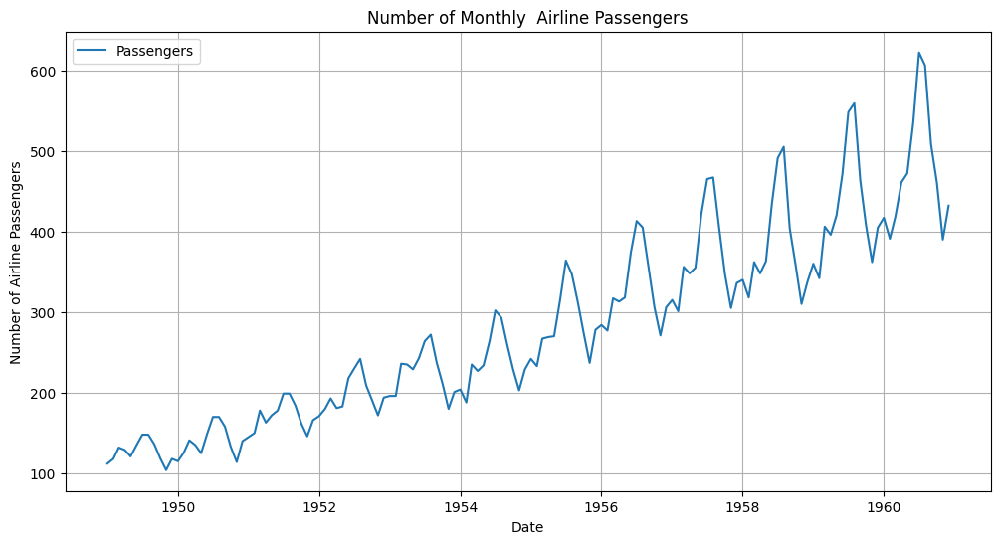

In [14]:
console.print("Plotting the Airline Passegers data\n",style= "bold underline")
plt.figure(figsize=(12,6))
plt.plot(airlinepass_data.index.to_timestamp(), airlinepass_data['Passengers'], label= 'Passengers')
plt.title('Number of Monthly  Airline Passengers')
plt.ylabel("Number of Airline Passengers")
plt.xlabel("Date")
plt.legend()
plt.grid()
plt.show()

Plotting the Apple Stock Close Data

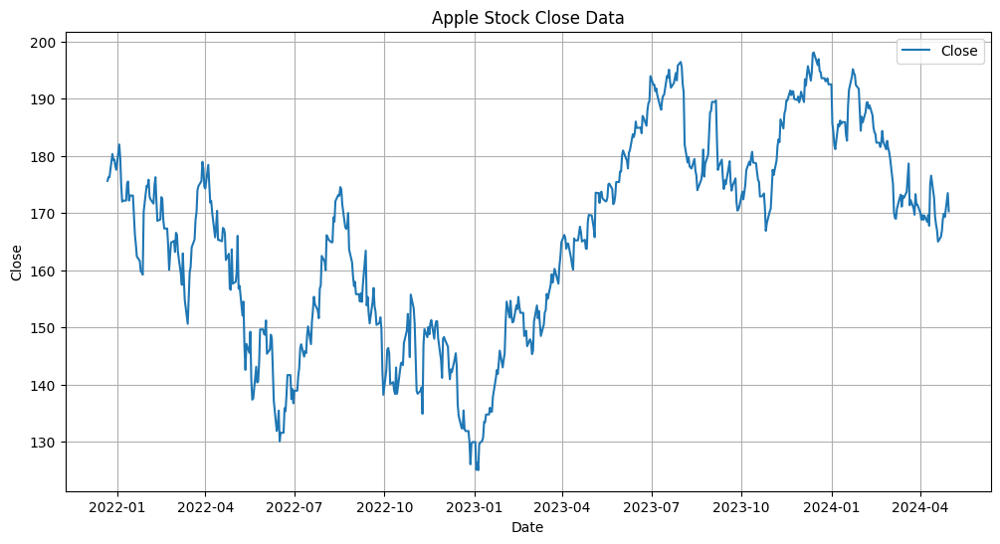

In [15]:
console.print("Plotting the Apple Stock Close Data\n",style= "bold underline")
plt.figure(figsize=(12,6))
plt.plot(Apple_stock_close_data['Close'], label= 'Close')
plt.title('Apple Stock Close Data')
plt.ylabel("Close")
plt.xlabel("Date")
plt.legend()
plt.grid()
plt.show()

## DATA TRANSFORMATION
* To simplify Patterns and make data more consistent across the eentire dataset,I will apply various mathematical transformations across the entire airline Passenger data. Transformation help in stabilizing the variance and make data more suitable for modelling
  

## Logorithmic Transformation
* The logorithmic Transformation helps in stabilizing the variance of the data especailly if the data spans several orders of magnitude

In [16]:
## The Airline Passenger Data  
airlinepass_data['Log_Passengers'] = np.log(airlinepass_data['Passengers'])
## printing the first five rows  
airlinepass_data.head()

,Passengers,Log_Passengers
Month,,
1949-01,112,4.718499
1949-02,118,4.770685
1949-03,132,4.882802
1949-04,129,4.859812
1949-05,121,4.795791


Airline Passenger data with logorithmic transformation applied

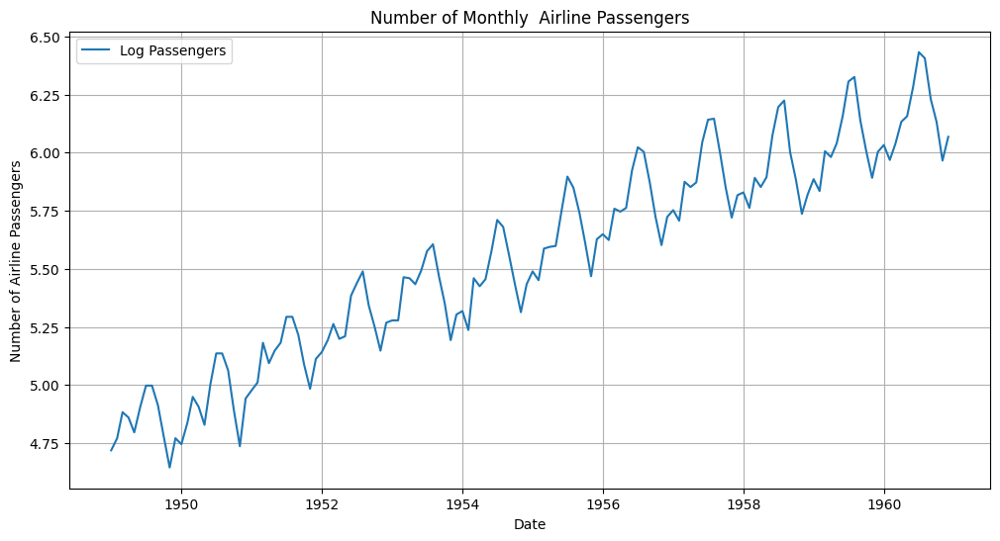

In [17]:
## visualizing 
console.print("Airline Passenger data with logorithmic transformation applied\n",style="bold underline")
plt.figure(figsize=(12,6))
plt.plot(airlinepass_data.index.to_timestamp(), airlinepass_data['Log_Passengers'], label= 'Log Passengers')
plt.title('Number of Monthly  Airline Passengers')
plt.ylabel("Number of Airline Passengers")
plt.xlabel("Date")
plt.legend()
plt.grid()
plt.show()

In [18]:
## for the stock Price data
Apple_stock_close_data['Log_close'] = np.log(Apple_stock_close_data['Close'])
## print the first five rows  
Apple_stock_close_data.head()

,Close,Log_close
Date,,
2021-12-22,175.639999,5.168436
2021-12-23,176.279999,5.172074
2021-12-24,176.279999,5.172074
2021-12-27,180.330002,5.194789
2021-12-28,179.289993,5.189005


Apple Stock Close  data with logorithmic transformation applied

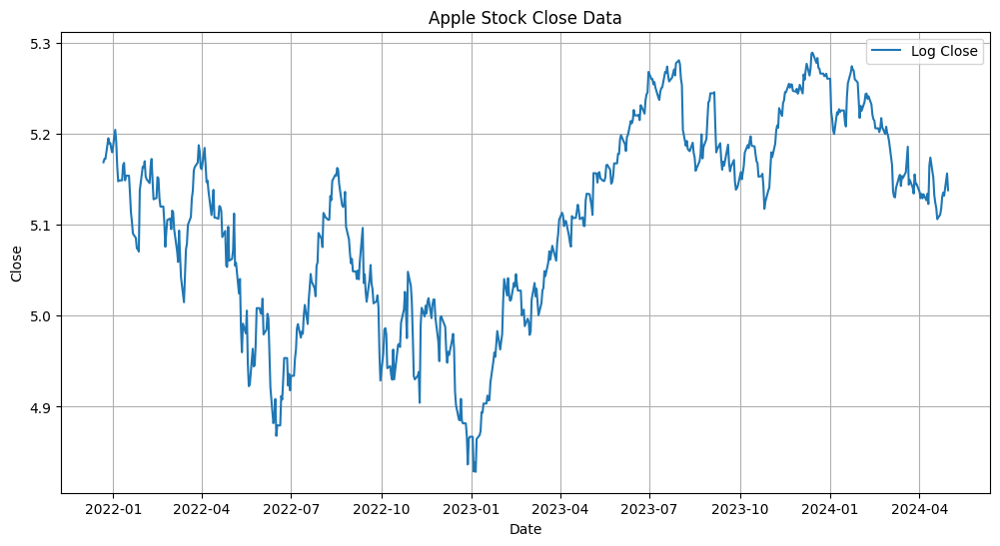

In [19]:
## visuualizing  
console.print("Apple Stock Close  data with logorithmic transformation applied\n",style="bold underline")
plt.figure(figsize=(12,6))
plt.plot(Apple_stock_close_data['Log_close'], label= 'Log Close')
plt.title('Apple Stock Close Data')
plt.ylabel("Close")
plt.xlabel("Date")
plt.legend()
plt.grid()
plt.show()

## Power Transformation
* A  Power transformation such as square root transformation helps in stabilizing the variance and  making data more normally distrributed 

In [20]:
## Power tranformation to the Airline Passenger data  
airlinepass_data['Sqrt_Passengers'] = np.sqrt(airlinepass_data['Passengers'])
## printt the fist five items in the airline passenger data  
airlinepass_data.head()

,Passengers,Log_Passengers,Sqrt_Passengers
Month,,,
1949-01,112,4.718499,10.583005
1949-02,118,4.770685,10.862780
1949-03,132,4.882802,11.489125
1949-04,129,4.859812,11.357817
1949-05,121,4.795791,11.000000


Airline Passenger data where I applied Power Transformation

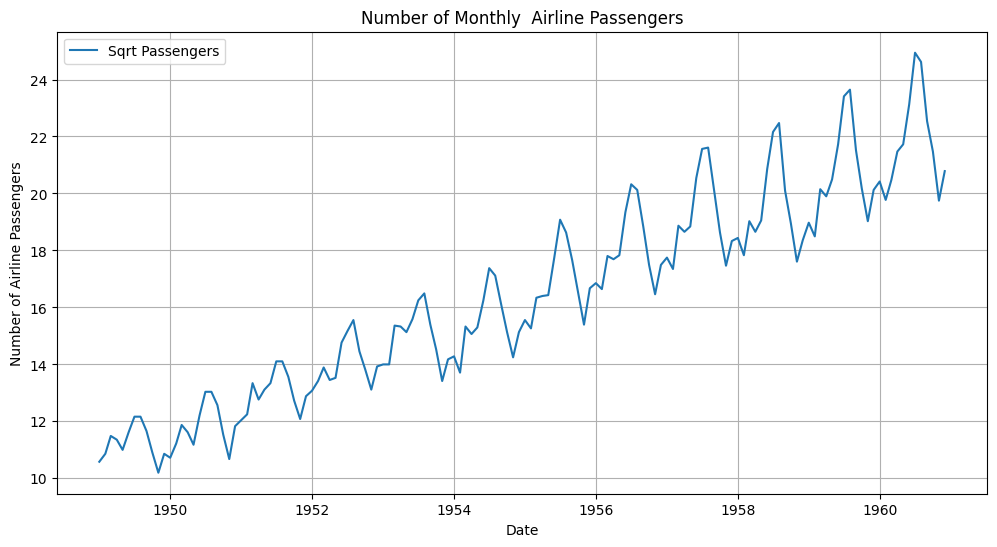

In [21]:
## visualizations  
console.print("Airline Passenger data where I applied Power Transformation\n",style="bold underline")
plt.figure(figsize=(12,6))
plt.plot(airlinepass_data.index.to_timestamp(), airlinepass_data['Sqrt_Passengers'], label= 'Sqrt Passengers')
plt.title('Number of Monthly  Airline Passengers')
plt.ylabel("Number of Airline Passengers")
plt.xlabel("Date")
plt.legend()
plt.grid()
plt.show()

In [22]:
## for the stock price data  
Apple_stock_close_data['Sqrt_Close'] = np.sqrt(Apple_stock_close_data['Close'])
## print the first 5 rows in a apple stock  
Apple_stock_close_data.head()

,Close,Log_close,Sqrt_Close
Date,,,
2021-12-22,175.639999,5.168436,13.252924
2021-12-23,176.279999,5.172074,13.277048
2021-12-24,176.279999,5.172074,13.277048
2021-12-27,180.330002,5.194789,13.428701
2021-12-28,179.289993,5.189005,13.389921


Apple stock close data where I applied Power Transformation

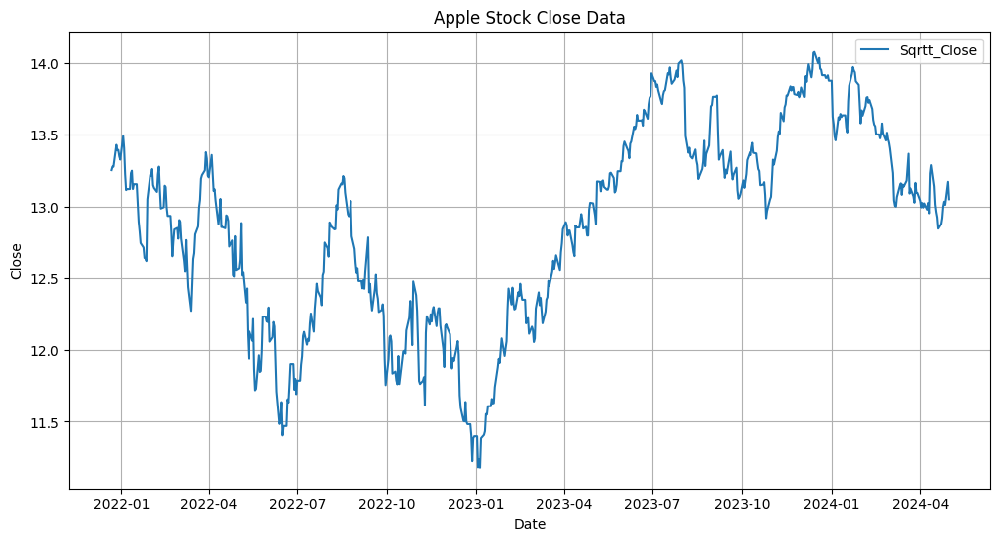

In [23]:
## visualizing the appple stocl price data  
console.print("Apple stock close data where I applied Power Transformation\n",style="bold underline")
plt.figure(figsize=(12,6))
plt.plot(Apple_stock_close_data['Sqrt_Close'], label= 'Sqrtt_Close')
plt.title('Apple Stock Close Data')
plt.ylabel("Close")
plt.xlabel("Date")
plt.legend()
plt.grid()
plt.show()

## Box-Cox Transformation
- Box-cox Transformation is a more flexible Transformation that can handle a wide range of transformations. it requires all the data to be positive , whicch our dataset already statisfies .
- if our dataset had negative values , we wouldd have opted for yeojohnson transformation as the alternative to Box-cox transformation

In [24]:
from scipy.stats import boxcox , yeojohnson

In [25]:
## Airrline Passenger data  
airlinepass_data['Boxcox_Passengers'], optimal_lambda = boxcox(airlinepass_data['Passengers'])
## displaying the first five items   
airlinepass_data.head()

,Passengers,Log_Passengers,Sqrt_Passengers,Boxcox_Passengers
Month,,,,
1949-01,112,4.718499,10.583005,6.827490
1949-02,118,4.770685,10.862780,6.932822
1949-03,132,4.882802,11.489125,7.161892
1949-04,129,4.859812,11.357817,7.114611
1949-05,121,4.795791,11.000000,6.983787


Airline Passenger data where i applied Boxcox Transformation

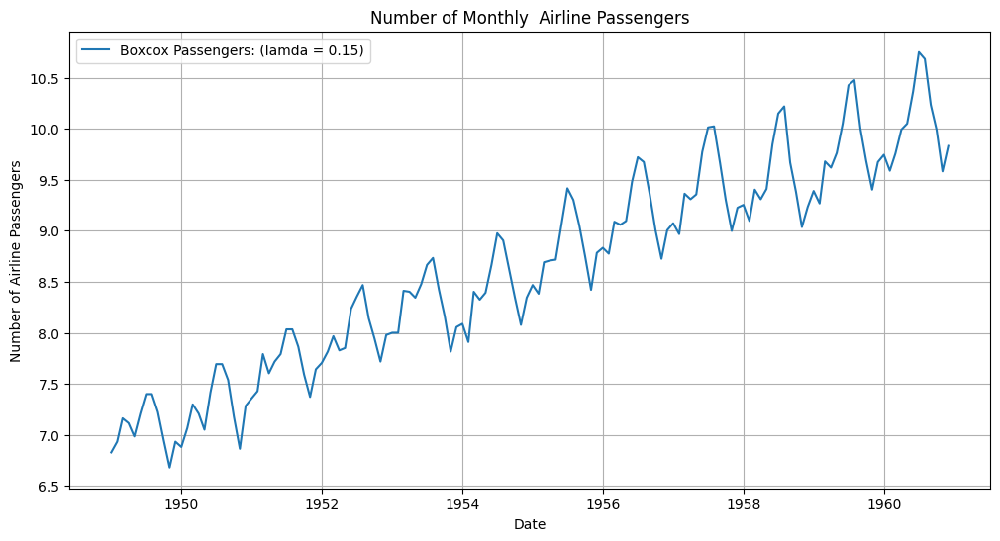

In [26]:
## visualizing the data 
console.print("Airline Passenger data where i applied Boxcox Transformation\n",style="bold underline")
plt.figure(figsize=(12,6))
plt.plot(airlinepass_data.index.to_timestamp(), airlinepass_data['Boxcox_Passengers'], label= f'Boxcox Passengers: (lamda = {optimal_lambda:.2f})')
plt.title('Number of Monthly  Airline Passengers')
plt.ylabel("Number of Airline Passengers")
plt.xlabel("Date")
plt.legend()
plt.grid()
plt.show()

In [27]:
## the apple stock close data  
Apple_stock_close_data['Boxcox_Close'],optimal_lambda = boxcox(Apple_stock_close_data['Close'])
## print the forst five items  
Apple_stock_close_data.head()

,Close,Log_close,Sqrt_Close,Boxcox_Close
Date,,,,
2021-12-22,175.639999,5.168436,13.252924,12004.871770
2021-12-23,176.279999,5.172074,13.277048,12090.157482
2021-12-24,176.279999,5.172074,13.277048,12090.157482
2021-12-27,180.330002,5.194789,13.428701,12636.659878
2021-12-28,179.289993,5.189005,13.389921,12495.201675


Apple stock Close data where i applied Boxcox Transformation

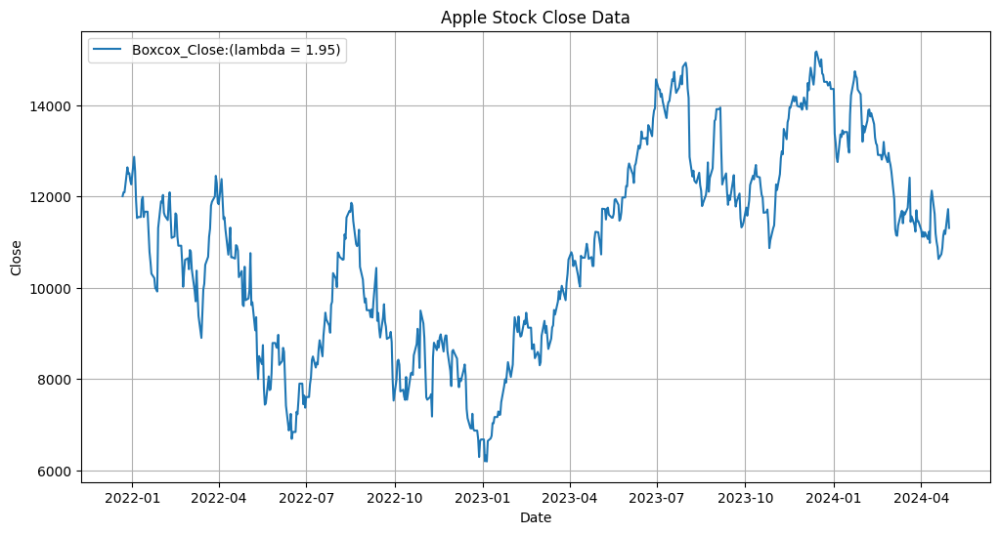

In [28]:
## visualization  
console.print("Apple stock Close data where i applied Boxcox Transformation\n",style="bold underline")
plt.figure(figsize=(12,6))
plt.plot(Apple_stock_close_data['Boxcox_Close'], label= f'Boxcox_Close:(lambda = {optimal_lambda:.2f})')
plt.title('Apple Stock Close Data')
plt.ylabel("Close")
plt.xlabel("Date")
plt.legend()
plt.grid()
plt.show()

A visual of the all Transformations applied to Airline Pasengers data

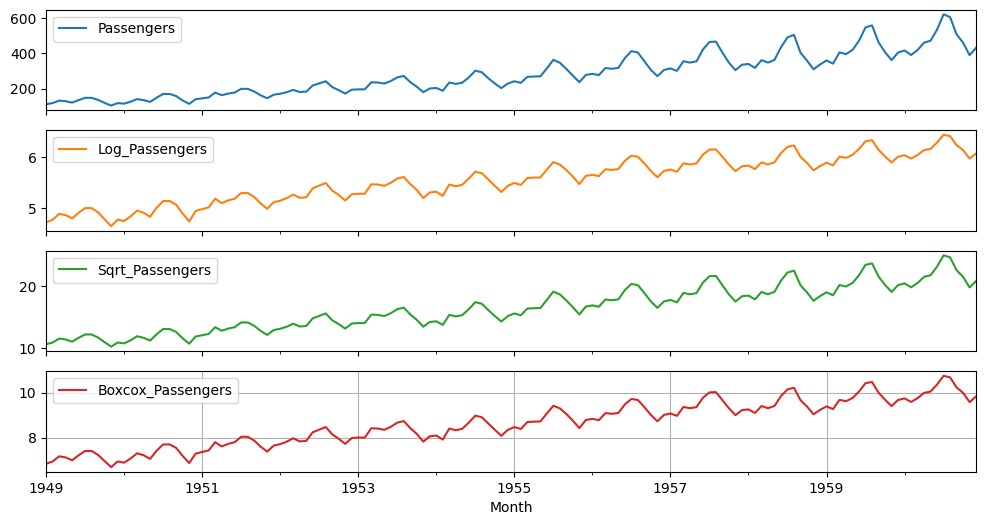

In [29]:
## ploting a visual of all the trransformations  
console.print("A visual of the all Transformations applied to Airline Pasengers data\n",style="bold underline")
airlinepass_data.plot(subplots= True , figsize=(12,6))
plt.grid()
plt.show()

A visual of all the Transformations applied in Apple stock Price Data

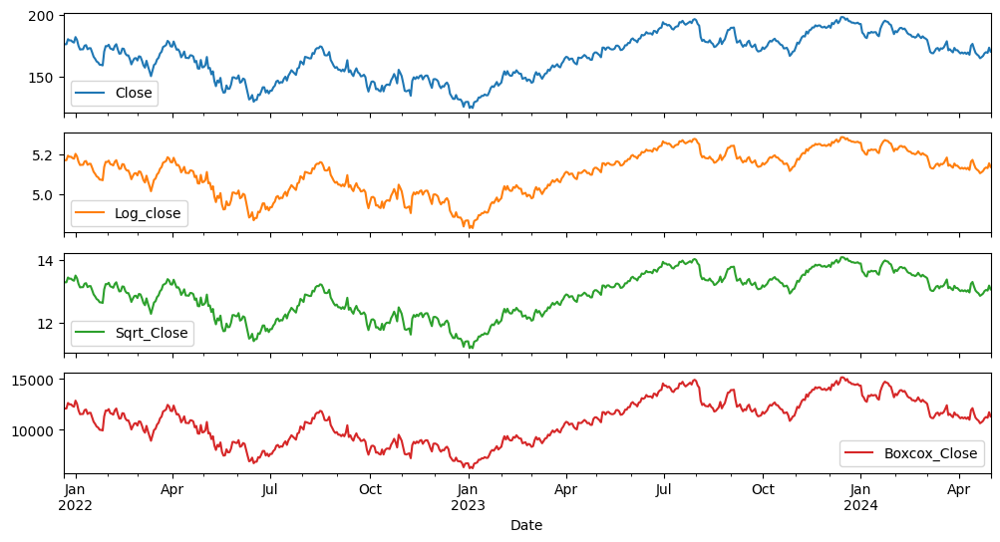

In [30]:
console.print("A visual of all the Transformations applied in Apple stock Price Data\n", style = "bold underline")
Apple_stock_close_data.plot(subplots=True , figsize=(12,6))
plt.show()

#### Data Transformation can help in stabilizing variance by and Enhance Model Performance By: 
* stabilizing Variance:--> Reducing the Impact of outlier and make patterns moree consistent
* Improving Convergence:--> especially in deep learning as speeds up training and leads to better reesults

## ACF AND PACF
- ACF and PACF are essential statiscal tools in in time serie.  they help in identifying the depenedency between cuurrent and Past values of the time series which is crucial for model selection and understanding the underlying structure of the data

In [31]:
from statsmodels.graphics.tsaplots import plot_acf , plot_pacf

ACF AND PACF PLOTS FOR AIRLINE PASSENGER DATA

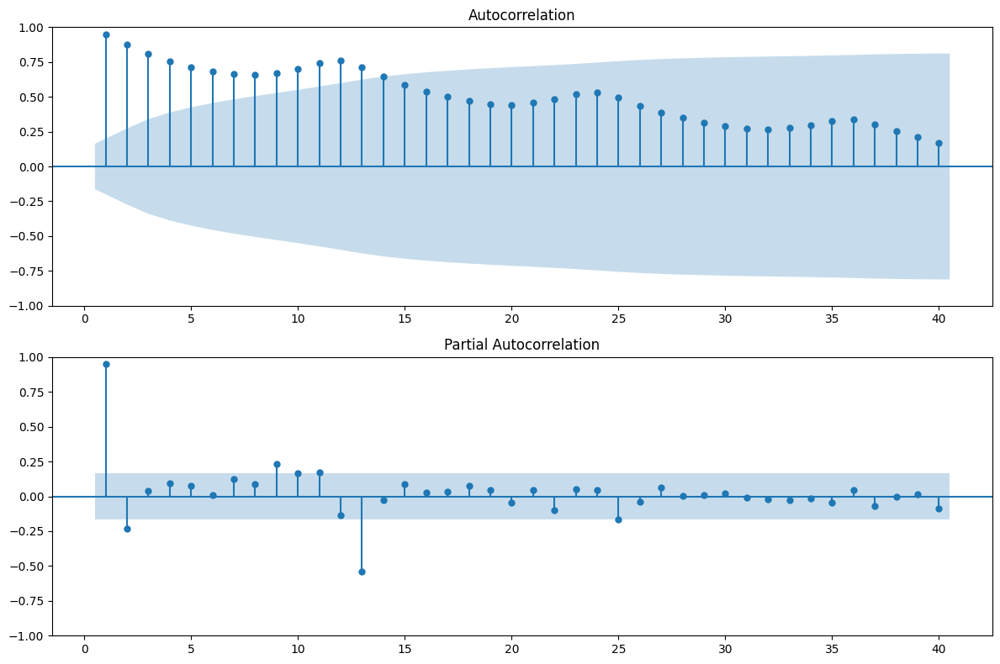

In [32]:
console.print("ACF AND PACF PLOTS FOR AIRLINE PASSENGER DATA\n",style='bold underline')
plt.figure(figsize=(12,8))
plt.subplot(211)
plot_acf(airlinepass_data['Passengers'] , ax=plt.gca(),zero=False,lags=40)
plt.subplot(212)
plot_pacf(airlinepass_data['Passengers'] , ax=plt.gca(),zero=False, lags=40)
plt.tight_layout()

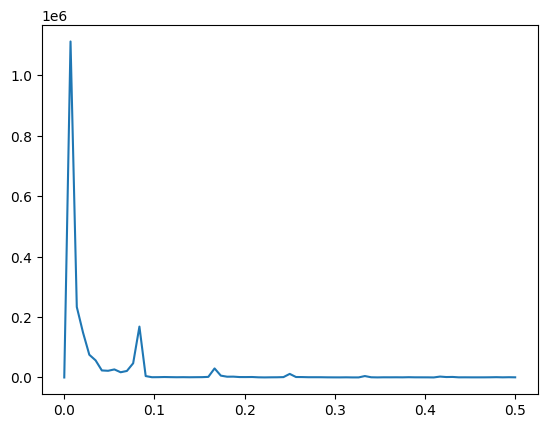

In [33]:
from statsmodels.graphics.tsaplots import plot_acf, plot_pacf
from scipy.signal import periodogram
# Example for periodogram:
frequencies, power = periodogram(airlinepass_data['Passengers'])
plt.plot(frequencies, power)
plt.show()


ACF AND PACF FOR THE APPLE STOCK DATA

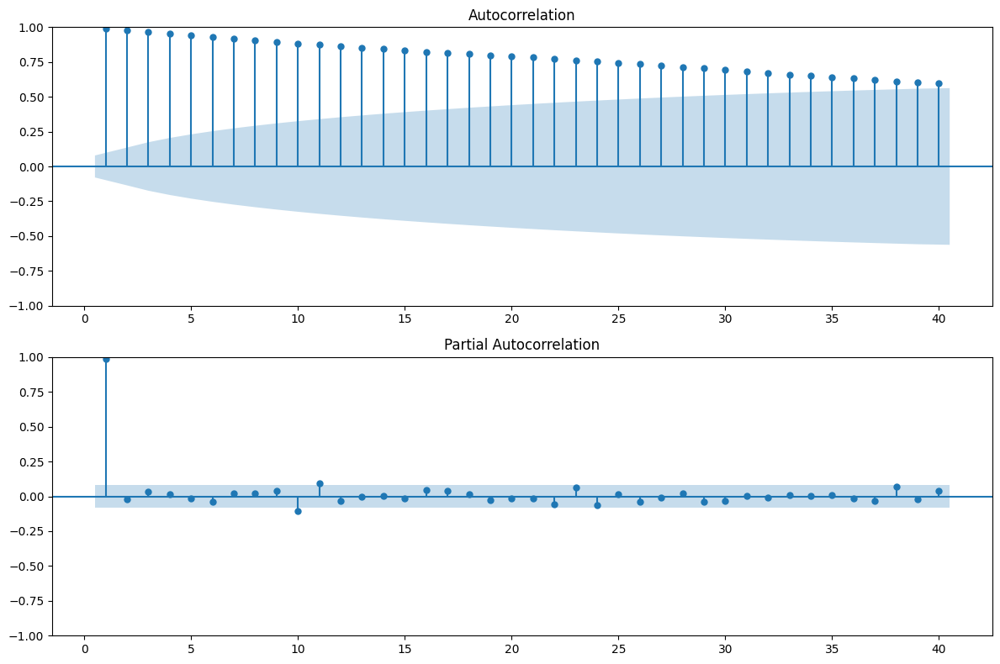

In [34]:
console.print("ACF AND PACF FOR THE APPLE STOCK DATA\n",style="bold underline")
plt.figure(figsize=(12,8))
plt.subplot(211)
plot_acf(Apple_stock_close_data['Close'], ax=plt.gca(),zero=False,lags=40)
plt.subplot(212)
plot_pacf(Apple_stock_close_data['Close'], ax=plt.gca(),zero=False, lags=40)
plt.tight_layout()

## STATIONARIY AND DIFFERENCING
- Stationarity is a key assumption in time series including ARIMA , A stationary time series has a constant mean and variance and its properties do not depend on time at which a series is observed: Non-stationary data can lead to unrelaible and spurious results, so its often necessary to transform non stationary data into stationary form
## Augmeneted Dickey Fuller (ADF) Test 
- The ADF test is a statiscal tool used to check for stationarity , if the P-Value is less than (0.05) we reject the Null hypothesis , which is the series is Non- Stationary in Favour of the Alternative hypothesis
## Differencing 
- Differencing is a ccommon techniquue to archive stationarity , it involves substracting two consecutive observations (previous from current) observations. This can be Repaeted until a series becoomes stationary , its called (second differencing)

In [35]:
from statsmodels.tsa.stattools import adfuller

In [36]:
## Applying ADF test to our airline passenger data   
adfuller(airlinepass_data.Passengers)

(0.8153688792060482,
 0.991880243437641,
 13,
 130,
 {'1%': -3.4816817173418295,
  '5%': -2.8840418343195267,
  '10%': -2.578770059171598},
 996.692930839019)

In [37]:
## creating a function to get a more readable test 
def adf_test(df , title=""):
    console.print(f" ADF TEST FOR: {title}", style="bold underline")
    results = adfuller(df.dropna(), autolag="AIC")
    labels = ['ADF TEST STATIC','P-VALUE','NUMBER OF LAGS','NUMBER OF OBSERVATIONS']
    out  = pd.Series(results[0:4] , index=labels)
    for key , value in results[4].items():  
        out[f"CRITICAL VALUE ({key})"] = value
    print(out.to_string())
    if results[1] <= 0.05:
         print()
         console.print("=> The Series is Stationary", style="bold underline")
    else:
        print()
        console.print("=> The Series is Non-Stationary", style="bold underline")
adf_test(airlinepass_data['Passengers'] , title='Airline Passenger Data--Original')

 ADF TEST FOR: Airline Passenger Data--Original

ADF TEST STATIC             0.815369
P-VALUE                     0.991880
NUMBER OF LAGS             13.000000
NUMBER OF OBSERVATIONS    130.000000
CRITICAL VALUE (1%)        -3.481682
CRITICAL VALUE (5%)        -2.884042
CRITICAL VALUE (10%)       -2.578770



=> The Series is Non-Stationary

In [38]:
## checking for the Apple stock data  
adf_test(Apple_stock_close_data['Close'], title="Apple close stock--Original")

 ADF TEST FOR: Apple close stock--Original

ADF TEST STATIC            -1.959592
P-VALUE                     0.304566
NUMBER OF LAGS              0.000000
NUMBER OF OBSERVATIONS    614.000000
CRITICAL VALUE (1%)        -3.441045
CRITICAL VALUE (5%)        -2.866259
CRITICAL VALUE (10%)       -2.569283



=> The Series is Non-Stationary

In [39]:
## for airline Passenger data
airlinepass_data['Passengers_diff'] = airlinepass_data['Passengers'].diff()
## printing the data 
airlinepass_data.head()

,Passengers,Log_Passengers,Sqrt_Passengers,Boxcox_Passengers,Passengers_diff
Month,,,,,
1949-01,112,4.718499,10.583005,6.827490,NaN
1949-02,118,4.770685,10.862780,6.932822,6.0
1949-03,132,4.882802,11.489125,7.161892,14.0
1949-04,129,4.859812,11.357817,7.114611,-3.0
1949-05,121,4.795791,11.000000,6.983787,-8.0


Differenced Airline Passenger Visual on the Passenger Data

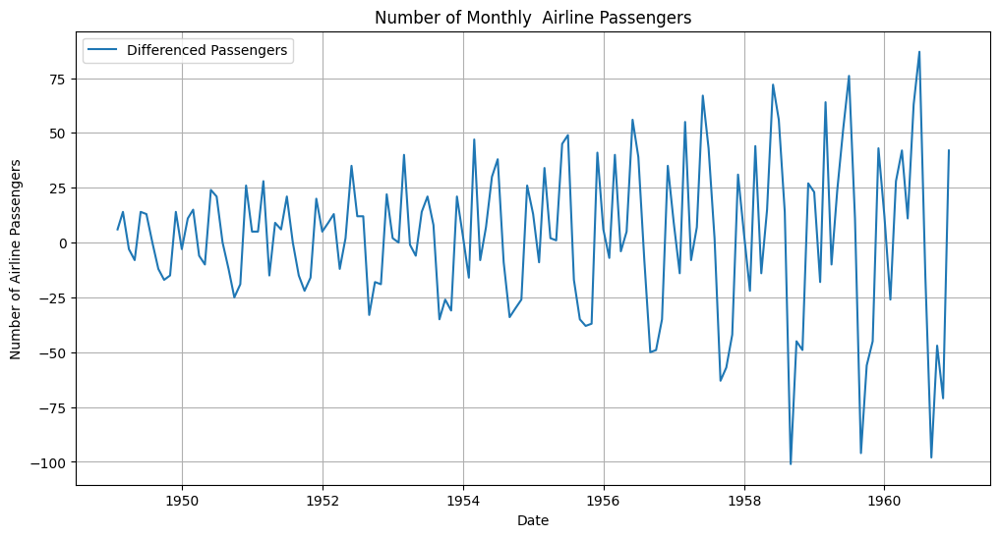

In [40]:
## visualization  
console.print("Differenced Airline Passenger Visual on the Passenger Data\n", style ='bold underline')
plt.figure(figsize=(12,6))
plt.plot(airlinepass_data.index.to_timestamp(), airlinepass_data['Passengers_diff'], label= 'Differenced Passengers')
plt.title('Number of Monthly  Airline Passengers')
plt.ylabel("Number of Airline Passengers")
plt.xlabel("Date")
plt.legend()
plt.grid()
plt.show()

In [41]:
## checking for stationarity of the differnced Passengers 
adf_test(airlinepass_data['Passengers_diff'], title='Differenced Passengers test')

 ADF TEST FOR: Differenced Passengers test

ADF TEST STATIC            -2.829267
P-VALUE                     0.054213
NUMBER OF LAGS             12.000000
NUMBER OF OBSERVATIONS    130.000000
CRITICAL VALUE (1%)        -3.481682
CRITICAL VALUE (5%)        -2.884042
CRITICAL VALUE (10%)       -2.578770



=> The Series is Non-Stationary

In [42]:
## Applying Differenced to one of the Transformed dataa 
airlinepass_data['differenced_Boxcox'] = airlinepass_data['Boxcox_Passengers'].diff()
### print the first five iteems   
airlinepass_data.head()

,Passengers,Log_Passengers,Sqrt_Passengers,Boxcox_Passengers,Passengers_diff,differenced_Boxcox
Month,,,,,,
1949-01,112,4.718499,10.583005,6.827490,NaN,NaN
1949-02,118,4.770685,10.862780,6.932822,6.0,0.105332
1949-03,132,4.882802,11.489125,7.161892,14.0,0.229069
1949-04,129,4.859812,11.357817,7.114611,-3.0,-0.047281
1949-05,121,4.795791,11.000000,6.983787,-8.0,-0.130824


Differenced Airline Passenger Visual on the Transformed Boxcox data Data

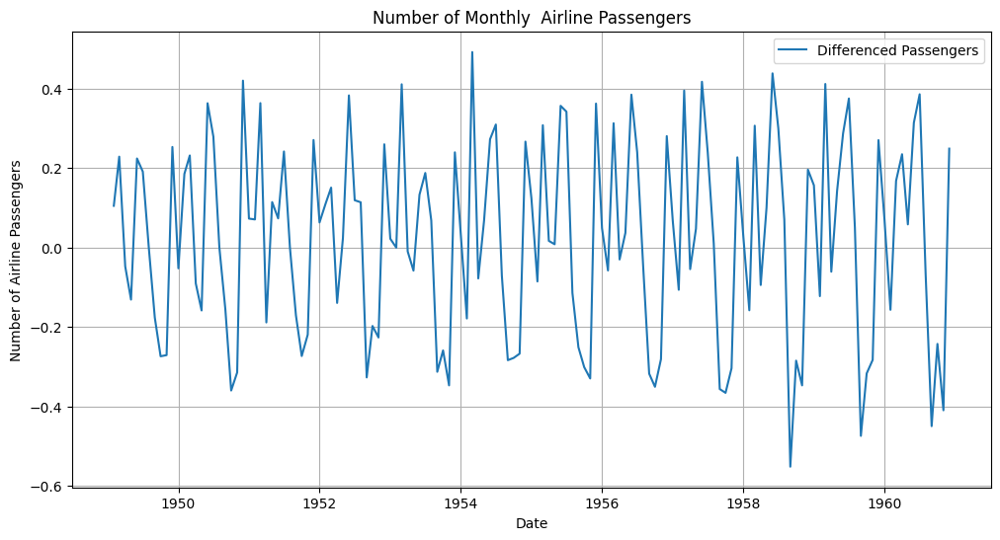

In [43]:
## visualize  
## visualization  
console.print("Differenced Airline Passenger Visual on the Transformed Boxcox data Data\n", style ='bold underline')
plt.figure(figsize=(12,6))
plt.plot(airlinepass_data.index.to_timestamp(), airlinepass_data['differenced_Boxcox'], label= 'Differenced Passengers')
plt.title('Number of Monthly  Airline Passengers')
plt.ylabel("Number of Airline Passengers")
plt.xlabel("Date")
plt.legend()
plt.grid()
plt.show()

In [44]:
## checking for stationarity  
adf_test(airlinepass_data['differenced_Boxcox'],title="Boxcox differenced Airline Passsenger data")

 ADF TEST FOR: Boxcox differenced Airline Passsenger data

ADF TEST STATIC            -2.871708
P-VALUE                     0.048738
NUMBER OF LAGS             14.000000
NUMBER OF OBSERVATIONS    128.000000
CRITICAL VALUE (1%)        -3.482501
CRITICAL VALUE (5%)        -2.884398
CRITICAL VALUE (10%)       -2.578960



=> The Series is Stationary

In [45]:
## The Apple stock Price Data 
Apple_stock_close_data['diff_close'] = Apple_stock_close_data['Close'].diff()
### pprint the first five rows 
Apple_stock_close_data.head()

,Close,Log_close,Sqrt_Close,Boxcox_Close,diff_close
Date,,,,,
2021-12-22,175.639999,5.168436,13.252924,12004.871770,NaN
2021-12-23,176.279999,5.172074,13.277048,12090.157482,0.639999
2021-12-24,176.279999,5.172074,13.277048,12090.157482,0.000000
2021-12-27,180.330002,5.194789,13.428701,12636.659878,4.050003
2021-12-28,179.289993,5.189005,13.389921,12495.201675,-1.040009


Visualization of the differenced cllose data

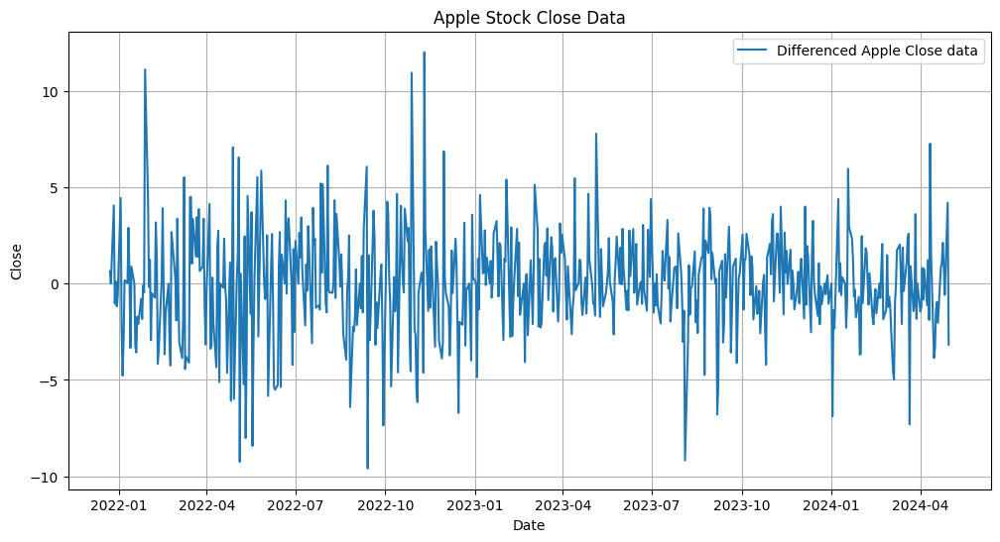

In [46]:
## visualization  
console.print("Visualization of the differenced cllose data\n",style="bold underline")
plt.figure(figsize=(12,6))
plt.plot(Apple_stock_close_data['diff_close'], label= 'Differenced Apple Close data')
plt.title('Apple Stock Close Data')
plt.ylabel("Close")
plt.xlabel("Date")
plt.legend()
plt.grid()
plt.show()

In [47]:
## checking for stationary   
adf_test(Apple_stock_close_data['Close'], title="Close Data")

 ADF TEST FOR: Close Data

ADF TEST STATIC            -1.959592
P-VALUE                     0.304566
NUMBER OF LAGS              0.000000
NUMBER OF OBSERVATIONS    614.000000
CRITICAL VALUE (1%)        -3.441045
CRITICAL VALUE (5%)        -2.866259
CRITICAL VALUE (10%)       -2.569283



=> The Series is Non-Stationary

In [48]:
adf_test(Apple_stock_close_data['diff_close'], title="Differenced Close Data")

 ADF TEST FOR: Differenced Close Data

ADF TEST STATIC           -24.456572
P-VALUE                     0.000000
NUMBER OF LAGS              0.000000
NUMBER OF OBSERVATIONS    613.000000
CRITICAL VALUE (1%)        -3.441063
CRITICAL VALUE (5%)        -2.866266
CRITICAL VALUE (10%)       -2.569287



=> The Series is Stationary

* By pperforming ADF test we can determine whether our seriies is stationary or not, if the series is non stationary , we apply differencing to make the data sttationary , this transfoormation is essential for making long term Predictions

## Seasonal Decomposition
- Seasonal Decomposition is a method that separates a series into three components : Treend , Seasonal , Residual: This decomposition helps in understanding the underlying Patterns in the data which is usseful for modelling and Forecasting 

In [49]:
from statsmodels.tsa.seasonal import seasonal_decompose

Decomposed Airrline Passenger Data

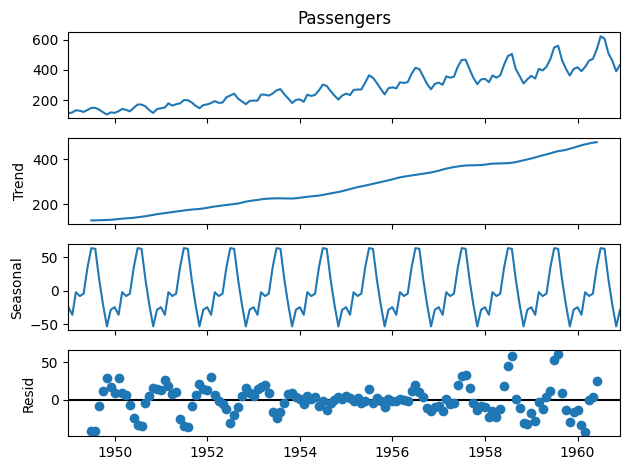

In [50]:
## Decompoing the aiirline Passenger data 
temp_decompsed_airlinepass = airlinepass_data.copy()
temp_decompsed_airlinepass.index = pd.to_datetime(temp_decompsed_airlinepass.index.to_timestamp())
decomposed_airlinepass =  seasonal_decompose(temp_decompsed_airlinepass['Passengers'])
## plot  
console.print("Decomposed Airrline Passenger Data\n",style="bold underline")
decomposed_airlinepass.plot()
plt.show()

Decomposed BoxCox and differenced Airrline Passenger Data

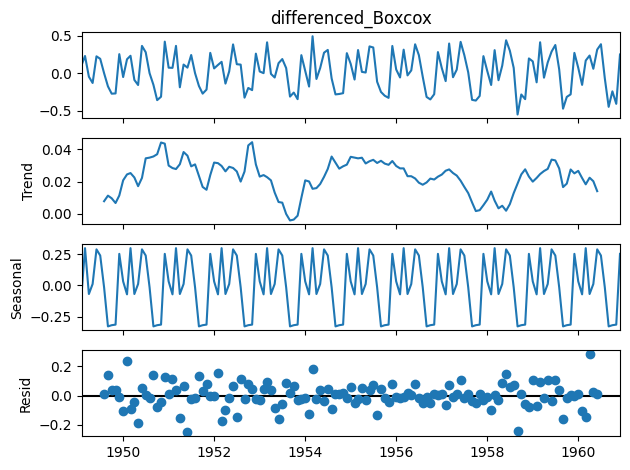

In [51]:
## Decompoing the aiirline Passenger data 
temp_decompsed_airlinepass = airlinepass_data.copy()
temp_decompsed_airlinepass.index = pd.to_datetime(temp_decompsed_airlinepass.index.to_timestamp())
decomposed_airlinepass =  seasonal_decompose(temp_decompsed_airlinepass['differenced_Boxcox'].dropna())
## plot  
console.print("Decomposed BoxCox and differenced Airrline Passenger Data\n",style="bold underline")
decomposed_airlinepass.plot()
plt.show()

Decomposed Apple stock Close Data

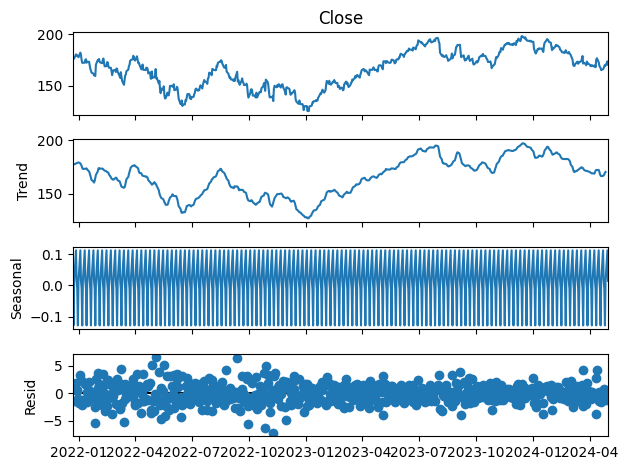

In [52]:
## checking Apple stock data  
Decomposed_apple_stock= seasonal_decompose(Apple_stock_close_data['Close'])
console.print("Decomposed Apple stock Close Data\n",style="bold underline")
Decomposed_apple_stock.plot()
plt.show()

### BenchMarking Forecasting Models
- i will create BenchMarks Aagaints the Original Airline Passenger Data


## Multi-Horizon BenchMarks

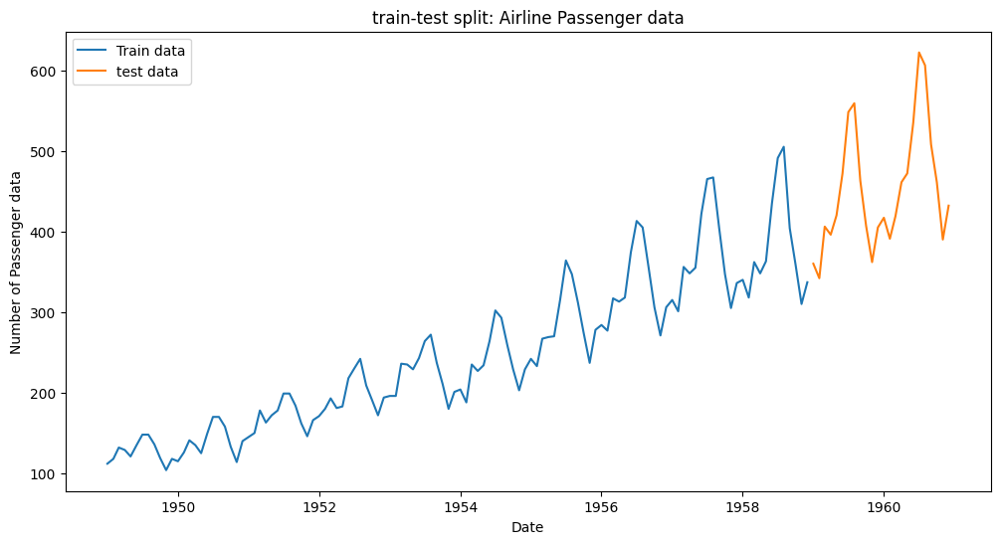

In [53]:
## split the data into train and test split  
train = airlinepass_data[['Passengers']][:-24] # all the data excludung the last 24 observations 
## test data  
test  = airlinepass_data[['Passengers']][-24:]
## plot the both train and test data  
plt.figure(figsize=(12,6))
plt.plot(train.index.to_timestamp(),train['Passengers'] , label ="Train data")
plt.plot(test.index.to_timestamp() , test['Passengers'], label = "test data")
plt.title('train-test split: Airline Passenger data')
plt.xlabel('Date')
plt.ylabel('Number of Passenger data')
plt.legend()
plt.show()

## BENChMark METHODS
- Bench Mark Methods are Simple and Interpretable approaches that we use to compare the perfformance of more complex forecasting models such as ETS ,Arima and others
-  They give us a Baseline Performance to beat
-  They include the Naive , Seasonal Naive , Mean and the Drift Forecasters

## The Naive Forecaster  Method
- The Naive Forecaster is a Simple Baseline method that assumes Future forecasts are more similar to most recent Past
- It is most effective when the time series exhibits flat or random behavior, meaning there are no clear trends or seasonality. In such cases, the naive forecast is often competitive with more sophisticated methods.
- Works well when data has minimal variability or predictable short-term behavior.
- Poor performance when trends or seasonality exist, as it does not account for long-term patterns.

In [54]:
## Applying the Naive Forecaster  
actual_data_naive  = test.copy()
## Naive forecast  
actual_data_naive['naive'] = train['Passengers'].iloc[-1]
## print the first five rows of the Naive forecast  
actual_data_naive.head()

,Passengers,naive
Month,,
1959-01,360,337
1959-02,342,337
1959-03,406,337
1959-04,396,337
1959-05,420,337


## Seasnal Naive Forecaster 
- The Seasonal Naive Forecaster is a simple baseline method that assumes future forecasts will repeat the observed values from the same season in the most recent cycle.
- It is most effective for time series with strong seasonality and minimal trends or irregular fluctuations.
- Simple and effective for capturing recurring seasonal patterns.
-  Performs poorly if the time series has strong trends or non-seasonal components.

In [55]:
actual_data_snaive = test.copy()
## Appying seasonal Naive 
seasonal_length = 12  
## Extracting last seasons data  
train_values_seasonal_naive =  train['Passengers'].values[-seasonal_length:]
## Repeeating the train_values_seasonal_naive values enough times to cover the test period  
actual_data_snaive['snaive'] = np.tile(train_values_seasonal_naive, len(test)//seasonal_length+1)[:len(test)]
## printing the dat  
actual_data_snaive.head()

,Passengers,snaive
Month,,
1959-01,360,340
1959-02,342,318
1959-03,406,362
1959-04,396,348
1959-05,420,363


## Mean Forecaster Method 
- The Mean Forecaster is a simple baseline method that assumes all future forecasts will be equal to the average of past observed values in the time series.
- It is most effective when the time series is stationary without trends or seasonality, and the mean provides a good central tendency.
- Simple to compute; effective when the mean represents the central tendency well.
-  Ignores trends, seasonality, and recent changes in the data.

In [56]:
## Applying the Mean forecast  
actual_data_mean =test.copy()
## calculating the forecast  
actual_data_mean['mean'] = train['Passengers'].mean()
## printing the actual data  
actual_data_mean.head()

,Passengers,mean
Month,,
1959-01,360,245.908333
1959-02,342,245.908333
1959-03,406,245.908333
1959-04,396,245.908333
1959-05,420,245.908333


## Drift Method Forecaster 
-  is a simple baseline method that assumes the future value will follow the linear trend established by the difference between the first and last observed values in the time series.
-  It is useful when there is a linear trend in the data, but no clear seasonality.
- Effective for data with a consistent linear trend.
- Does not account for seasonality or more complex trends.

In [57]:
## get the actual dataa 
actual_data_drift = test.copy()
## getting the number of period  
num_period = len(train)-1
## calculating the slope 
drift_or_Slope = ((train['Passengers'].iloc[-1]  -  train['Passengers'].iloc[0])/num_period).round(2)
## claculate the forecast  
actual_data_drift['drift'] = [train['Passengers'].iloc[-1] + (i+1)*drift_or_Slope for i in range(len(test))]
## pprint the first five rows   
actual_data_drift.head()

,Passengers,drift
Month,,
1959-01,360,338.89
1959-02,342,340.78
1959-03,406,342.67
1959-04,396,344.56
1959-05,420,346.45


In [73]:
# Function to ensure the index is DatetimeIndex
def ensure_datetime_index(df):
    if isinstance(df.index, pd.PeriodIndex):  # Convert PeriodIndex to DatetimeIndex
        df.index = df.index.to_timestamp()
    elif not isinstance(df.index, pd.DatetimeIndex):  # Convert other types to DatetimeIndex
        df.index = pd.to_datetime(df.index)

# Apply the function to each dataframe
ensure_datetime_index(train)
ensure_datetime_index(test)
ensure_datetime_index(actual_data_naive)
ensure_datetime_index(actual_data_snaive)
ensure_datetime_index(actual_data_mean)
ensure_datetime_index(actual_data_drift)


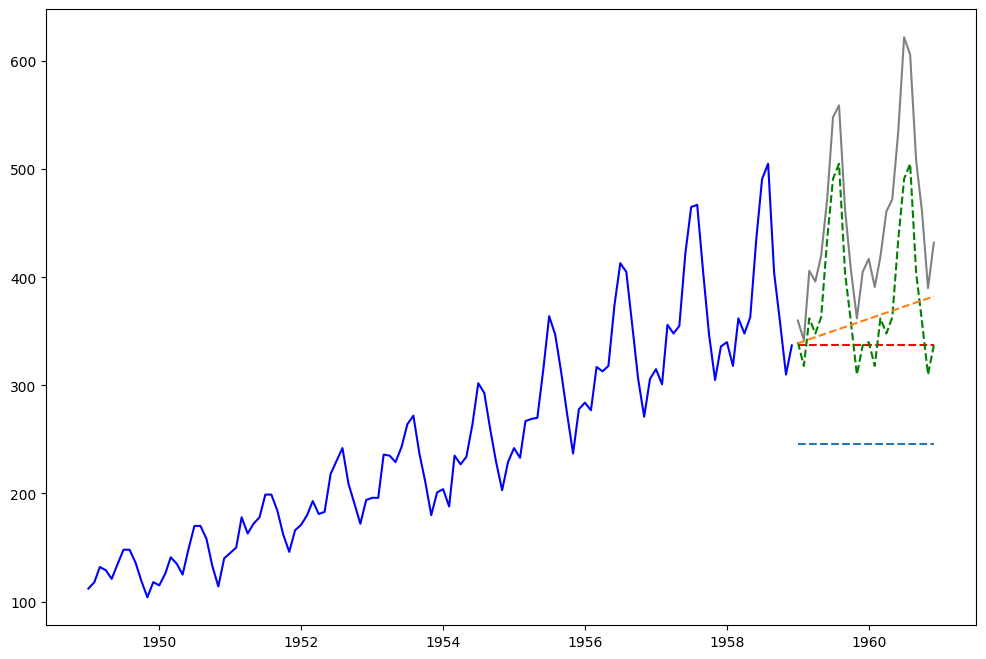

In [75]:
## plottiing the data  
plt.figure(figsize=(12,8))
plt.plot(train.index , train['Passengers'],label='Train data',color='blue')
plt.plot(test.index , test['Passengers'],label='Test data',color='grey')
plt.plot(actual_data_naive.index , actual_data_naive['naive'] , label='Naive Forecast',color='red',linestyle ='dashed')
plt.plot(actual_data_snaive.index , actual_data_snaive['snaive'] , label ='Seasnal Naive Forecast',color ='green',linestyle ='dashed')
plt.plot(actual_data_mean.index , actual_data_mean['mean'] , label = 'Mean Forecast', linestyle ='dashed')
plt.plot(actual_data_drift.index , actual_data_drift['drift'] , label = 'drift Forecast', linestyle ='dashed')
plt.show()

## ONE STEP AHEAD FORECAST 
- The term "one-step-ahead forecast" in time series analysis refers to predicting the next value eg at time t + 1 , based solely on the observed data up to the current time t



## Naive Foreacast One step Ahead forecast

In [76]:
## getting the actual data  
actual_data_naive_one_step_ahead = test.copy()
actual_data_naive_one_step_ahead['naive'] = actual_data_naive_one_step_ahead['Passengers'].shift(1)
actual_data_naive_one_step_ahead.head()

,Passengers,naive
Month,,
1959-01-01,360,NaN
1959-02-01,342,360.0
1959-03-01,406,342.0
1959-04-01,396,406.0
1959-05-01,420,396.0


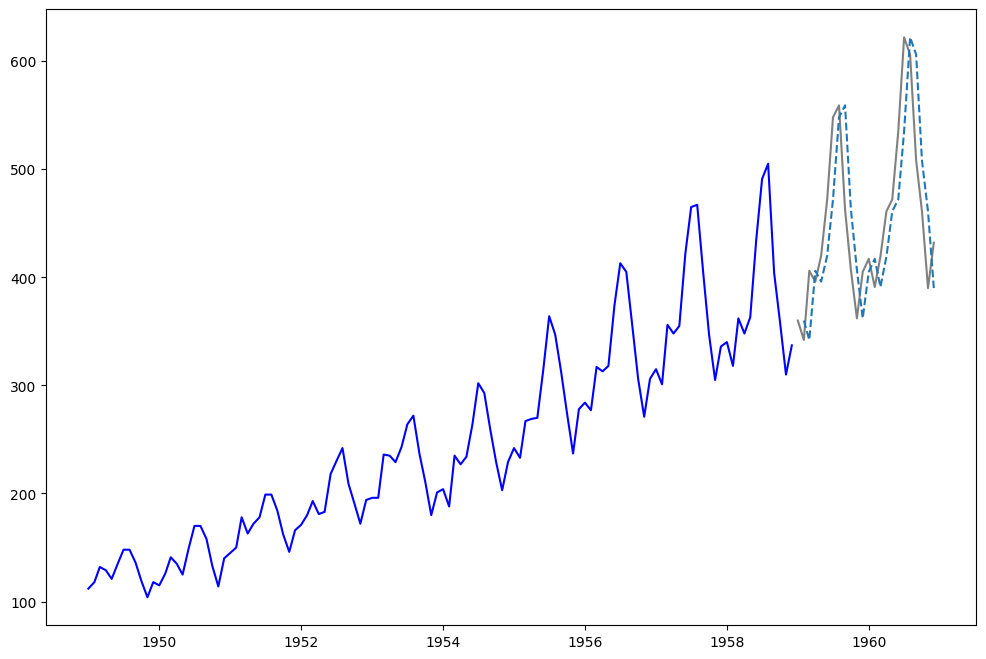

In [77]:
## changing the index  
actual_data_naive_one_step_ahead.index = pd.to_datetime(actual_data_naive.index)
## plottiing the data  
plt.figure(figsize=(12,8))
plt.plot(train.index , train['Passengers'],label='Train data',color='blue')
plt.plot(test.index , test['Passengers'],label='Test data',color='grey')
plt.plot(actual_data_naive_one_step_ahead.index, actual_data_naive_one_step_ahead['naive'],label='Naive forecast one step ahead',linestyle='dashed')
plt.show()

## Apple Stock Price Bench Marks 

In [78]:
train_Apple_stock = Apple_stock_close_data[['Close']][:-138]
test_Apple_stock = Apple_stock_close_data[['Close']][-138:]

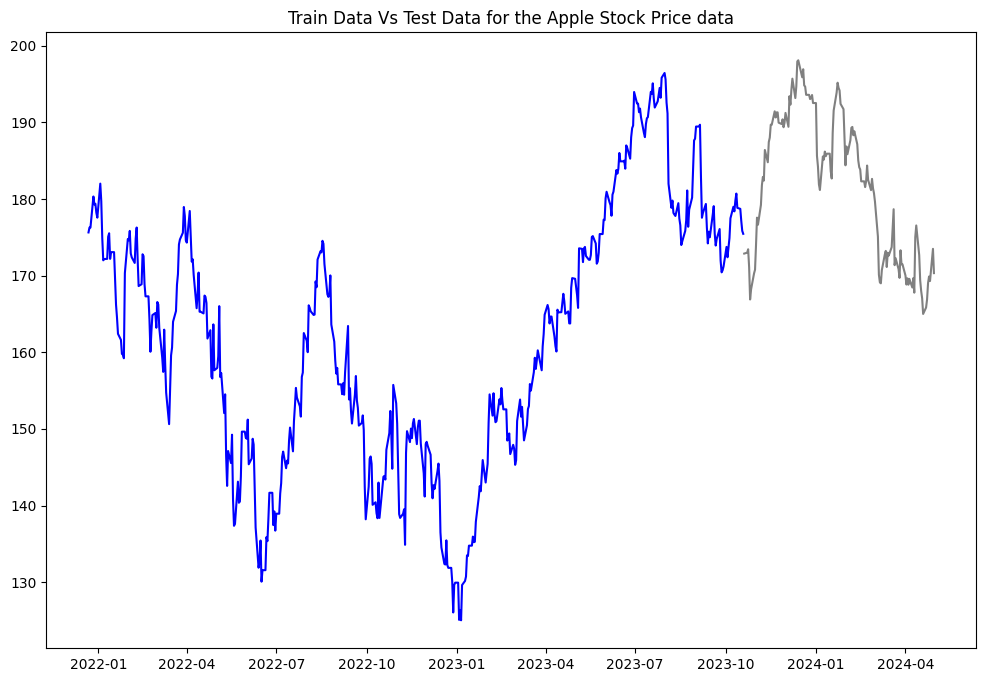

In [79]:
## ploting the data   
plt.figure(figsize=(12,8))
plt.plot(train_Apple_stock['Close'], label='Train Apple stock data',color='blue')
plt.plot(test_Apple_stock['Close'],label='Test Apple Stock data',color ='grey')
plt.title('Train Data Vs Test Data for the Apple Stock Price data')
plt.show()

## Naive Forecast

In [80]:
actual_data_naive_apple = test_Apple_stock.copy()
## calulate the Naive  
actual_data_naive_apple['naive'] = train_Apple_stock['Close'].iloc[-1]
## print the first five rows  
actual_data_naive_apple.head()

,Close,naive
Date,,
2023-10-20,172.880005,175.460007
2023-10-23,173.000000,175.460007
2023-10-24,173.440002,175.460007
2023-10-25,171.100006,175.460007
2023-10-26,166.889999,175.460007


## Seasonal Naive 

In [81]:
actual_data_snaive_apple = test_Apple_stock.copy()
## Define seasonal Length  
seasonal_length = 12   
## Extract last seasons data  
train_values_snaive_apple = train_Apple_stock['Close'].values[-seasonal_length:]
## Repeating the data enough times to match the test data  
actual_data_snaive_apple['snaive'] = np.tile(train_values_snaive_apple , len(test_Apple_stock)// seasonal_length+1)[:len(test_Apple_stock)]
## print the first five rows 
actual_data_snaive_apple.head()

,Close,snaive
Date,,
2023-10-20,172.880005,173.660004
2023-10-23,173.000000,174.910004
2023-10-24,173.440002,177.490005
2023-10-25,171.100006,178.990005
2023-10-26,166.889999,178.389999


## Mean Forecaster 

In [82]:
actual_data_mean_apple = test_Apple_stock.copy()
## calculate the mean forecasst  
actual_data_mean_apple['mean'] = train_Apple_stock['Close'].mean()
## display the fiirt five rows  
actual_data_mean_apple.head()

,Close,mean
Date,,
2023-10-20,172.880005,161.333941
2023-10-23,173.000000,161.333941
2023-10-24,173.440002,161.333941
2023-10-25,171.100006,161.333941
2023-10-26,166.889999,161.333941


## Drift Method

In [83]:
actual_data_drift_apple = test_Apple_stock.copy()
## calculate the num period  
num_periods = len(train_Apple_stock) - 1
## calculate the slope  
slope = ((train_Apple_stock['Close'].iloc[-1] -  train_Apple_stock['Close'].iloc[0] )/num_periods).round(3)
## calcualte the drift    
actual_data_drift_apple['drift'] = [train_Apple_stock['Close'].iloc[-1] + (i+1)*slope for i in range(len(test_Apple_stock))]
## print the first five rows  
actual_data_drift_apple.head()

,Close,drift
Date,,
2023-10-20,172.880005,175.460007
2023-10-23,173.000000,175.460007
2023-10-24,173.440002,175.460007
2023-10-25,171.100006,175.460007
2023-10-26,166.889999,175.460007


## Visualizations

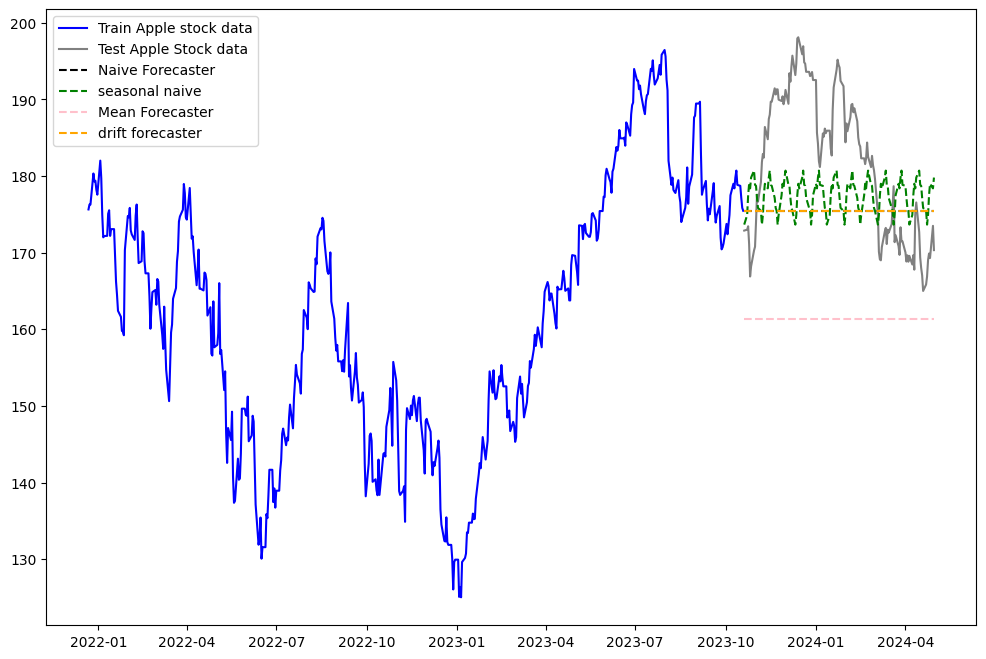

In [84]:
## ploting the data   
plt.figure(figsize=(12,8))
plt.plot(train_Apple_stock['Close'], label='Train Apple stock data',color='blue')
plt.plot(test_Apple_stock['Close'],label='Test Apple Stock data',color ='grey')
plt.plot(actual_data_naive_apple['naive'] , label='Naive Forecaster', color='black',linestyle = 'dashed')
plt.plot(actual_data_snaive_apple['snaive'] , label = 'seasonal naive',color ='green' , linestyle='dashed')
plt.plot(actual_data_mean_apple['mean'] , label ='Mean Forecaster',linestyle='dashed',color='pink')
plt.plot(actual_data_drift_apple['drift'] , label = 'drift forecaster',linestyle='dashed',color='orange')
plt.legend()
plt.show()

## One step Ahead Naive Forecaast

In [85]:
actual_data_apple = test_Apple_stock.copy()
actual_data_apple['naive'] = actual_data_apple['Close'].shift(1)
## pprinting the first five items   
actual_data_apple.head()

,Close,naive
Date,,
2023-10-20,172.880005,NaN
2023-10-23,173.000000,172.880005
2023-10-24,173.440002,173.000000
2023-10-25,171.100006,173.440002
2023-10-26,166.889999,171.100006


In [ ]:
## ploting the data   
plt.figure(figsize=(12,8))
plt.plot(train_Apple_stock['Close'], label='Train Apple stock data',color='blue')
plt.plot(test_Apple_stock['Close'],label='Test Apple Stock data',color ='green')
plt.plot(actual_data_apple['naive'],label = 'Naive_one_step_ahead',linestyle ='dashed',color='red')
plt.legend()
plt.show()